# Descripcion del hardware

Procesador: Intel(R) Core(TM) i5 8300H CPU @ 2.3GHz 2.3GHz

Ram: 20 Gb

Optane: 20 Gb

Vram:4Gb

Tarjeta de video: Nvidia  GeForce GTX 1050 @ compute capability: 6.1

# Descripcion de los datos

In [1]:
#II = np.array(np.round(I),np.uint8)
#IIg = cv2.adaptiveThreshold(II,175,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY,3,2)
#plt.imshow(IIg,cmap='gray')

# Preprocesamiento de las imagenes


In [2]:
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np
import cv2
import os 

In [3]:
print(tf.version)
tf.test.is_gpu_available(cuda_only=True, min_cuda_compute_capability=None)

<module 'tensorflow_core._api.v2.version' from 'C:\\Users\\jeiss\\.conda\\envs\\rstudio\\lib\\site-packages\\tensorflow_core\\_api\\v2\\version\\__init__.py'>


True

In [4]:
# Ruta raiz
PATH = 'C:/Users/jeiss/Documents/Repositorio para JupyterLab - Jupyter Noteboock/Mineria de Datos/Proyecto'
# Ruta de datos de entrada 
INPATH = PATH + '/inputFlowers'
# Ruta de datos de salida
OUPATH = PATH + '/outputFlowers'
# Ruta para los checkpoints
CKPATH = PATH + '/checkpoints'

imgurls = os.listdir(INPATH)

In [5]:
n = 500
randurls = np.copy(imgurls)
np.random.seed(23)
np.random.shuffle(randurls)
tr_urls = randurls[:n]
print(np.array(randurls).shape)
print(np.array(tr_urls).shape)
randurls

(8189,)
(500,)


array(['image_07739.jpg', 'image_07476.jpg', 'image_03111.jpg', ...,
       'image_01065.jpg', 'image_04839.jpg', 'image_00596.jpg'],
      dtype='<U15')

In [6]:
IMG_WIDTH = 256
IMG_HEIGHT = 256
#rescalado de imagenes
def resize(inimg,height,weidth):
    inimg = tf.image.resize(inimg,[height,weidth])
    return inimg
#cargue de imagenes en escala 0 a 1
def load_image(filename):
    inimg = tf.cast(tf.image.decode_jpeg(tf.io.read_file(INPATH + '/' + filename)),tf.float32)[...,:3]#limitando solo a 4 componentes de 3 colores RGB
    inimg = resize(inimg,IMG_HEIGHT,IMG_WIDTH)
    #inimg = inimg/175.5
    inimg = inimg/255 # la combierte de 0 a 1
    return inimg   

In [7]:
filename = randurls[0]
print(INPATH + '/' + filename)
print(type(load_image(randurls[0]).numpy()))
inimg = tf.cast(tf.image.decode_jpeg(tf.io.read_file(INPATH + '/' + filename)),tf.float32)[...,:3]#limitando solo a 4 componentes de 3 colores RGB
inimg = resize(inimg,IMG_HEIGHT,IMG_WIDTH)
inimg = inimg.numpy()
np.max(inimg)    

C:/Users/jeiss/Documents/Repositorio para JupyterLab - Jupyter Noteboock/Mineria de Datos/Proyecto/inputFlowers/image_07739.jpg
<class 'numpy.ndarray'>


255.0

In [8]:
# posterizacion (thresholding)
def posterization(img,treshold=0.5):
    img[img >= treshold] = 1.0
    img[img <  treshold] = 0.0
    return img

def posterization_inv(img,max=255):
    img[img >= max] = 2.0
    img[img <= 0.0] = max
    img[img <= 2.0] = 0.0
    return img

In [9]:
print(inimg.shape,np.min(inimg),np.max(inimg))

(256, 256, 3) 0.0 255.0


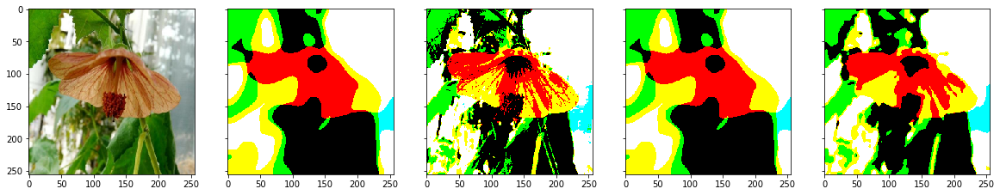

In [10]:
img = load_image(randurls[0])
# desenfoque gaussiano
imgg = cv2.GaussianBlur(img.numpy(), (61,61), 0)
imggp = posterization(imgg)
x = posterization(cv2.GaussianBlur(img.numpy(), (13,13), 0))

fig , ax = plt.subplots(nrows=1,ncols=5,sharex=True,sharey=True,figsize=(20,5))
ax[0].imshow(img)
ax[1].imshow(imgg)
ax[2].imshow(posterization(img.numpy()))
ax[3].imshow(imggp)
ax[4].imshow(x)

plt.show()

In [11]:
?cv2.threshold

Docstring:
threshold(src, thresh, maxval, type[, dst]) -> retval, dst
.   @brief Applies a fixed-level threshold to each array element.
.   
.   The function applies fixed-level thresholding to a multiple-channel array. The function is typically
.   used to get a bi-level (binary) image out of a grayscale image ( #compare could be also used for
.   this purpose) or for removing a noise, that is, filtering out pixels with too small or too large
.   values. There are several types of thresholding supported by the function. They are determined by
.   type parameter.
.   
.   Also, the special values #THRESH_OTSU or #THRESH_TRIANGLE may be combined with one of the
.   above values. In these cases, the function determines the optimal threshold value using the Otsu's
.   or Triangle algorithm and uses it instead of the specified thresh.
.   
.   @note Currently, the Otsu's and Triangle methods are implemented only for 8-bit single-channel images.
.   
.   @param src input array (multiple-cha

In [12]:
img = load_image('image_00269.jpg')#randurls[0]
imgg = cv2.GaussianBlur(img.numpy(), (31,31), 0)
x = posterization(cv2.GaussianBlur(img.numpy(), (13,13), 0))

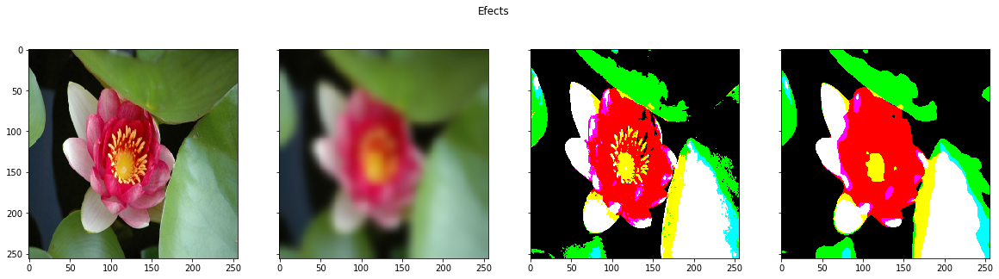

In [13]:
fig, axes = plt.subplots(nrows=1, ncols=4,sharex=True,sharey=True,figsize=(20,5))
#fig.subplots_adjust(wspace = 0.5 )
fig.suptitle('Efects')

axes[0].imshow(img)
axes[1].imshow(imgg)
axes[2].imshow(posterization(img.numpy()))
axes[3].imshow(x)# = plt

plt.show()

(256, 256, 3)
(256, 256) 0.99999994 0.008990702


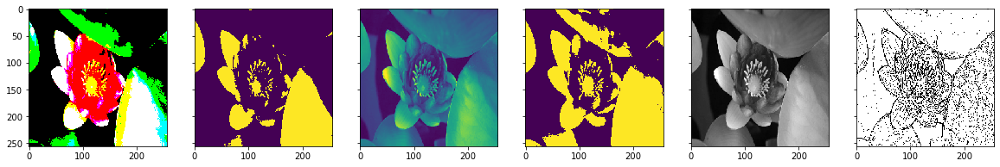

In [14]:
retval , thershold = cv2.threshold(img.numpy(),0.5,1,cv2.THRESH_BINARY)
print(thershold.shape)
#
grayscaled = cv2.cvtColor(img.numpy(),cv2.COLOR_BGR2GRAY)
retval2 , thershold2 = cv2.threshold(grayscaled,0.5,1,cv2.THRESH_BINARY)
#
grayscaled2 = cv2.cvtColor(img.numpy()*255,cv2.COLOR_BGR2GRAY)
retval22 , thershold22 = cv2.threshold(grayscaled2,100,255,cv2.THRESH_BINARY)
#
from skimage.color import rgb2gray
grayscale3 = rgb2gray(img.numpy())
print(grayscale3.shape,np.max(grayscale3),np.min(grayscale3))
#
BN = np.array(np.round(grayscaled*255),np.uint8)
gaus = cv2.adaptiveThreshold(BN,175,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY,3,2)
#
fig , ax = plt.subplots(1, 6, sharex = True, sharey = True , figsize = (20,5) )

ax[0].imshow(thershold)
ax[1].imshow(thershold2)
ax[2].imshow(grayscaled)
ax[3].imshow(thershold22)
ax[4].imshow(grayscale3,cmap=plt.cm.gray)
ax[5].imshow(gaus,cmap=plt.cm.gray)

plt.show()

359.99268
0.0 255.0


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<function matplotlib.pyplot.show(*args, **kw)>

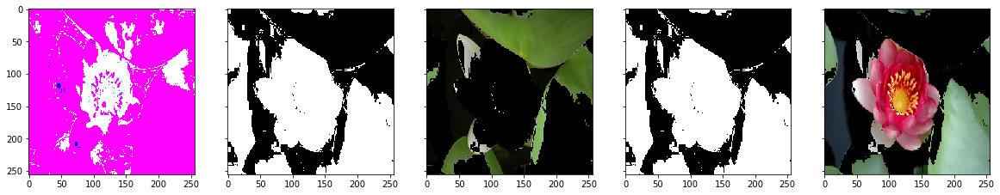

In [15]:
#https://stackoverflow.com/questions/48109650/how-to-detect-two-different-colors-using-cv2-inrange-in-python-opencv

img_hsv = cv2.cvtColor(img.numpy()*255, cv2.COLOR_RGB2HSV)
print(np.max(img_hsv))
k =  255/np.max(img_hsv)
img_hsv = np.round(img_hsv*k,0)
print(np.min(img_hsv),np.max(img_hsv))

# Elegimos el umbral de verde en HSV
lower_green = np.array([36, 0, 0])#36
upper_green = np.array([70, 255,255])
mask = cv2.inRange(img_hsv, lower_green, upper_green)
res = cv2.bitwise_and(img.numpy(), img.numpy(), mask=mask)
mask_inv = posterization_inv(mask,255)
resf = cv2.bitwise_and(img.numpy(), img.numpy(), mask=mask_inv)
#print(mask)#0 o 255

fig , ax = plt.subplots(1,5,sharex=True,sharey=True,figsize = (20,5))

ax[0].imshow(img_hsv,cmap='gray')
ax[1].imshow(mask,cmap='gray')
ax[2].imshow(res)
ax[3].imshow(mask_inv,cmap='gray')
ax[4].imshow(resf)

plt.show

0.0 246.38159


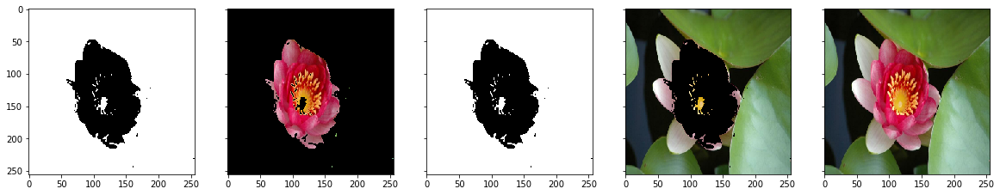

In [16]:
imgnp = img.numpy()*255
rgB = np.matrix(imgnp[:,:,0])
rGb = np.matrix(imgnp[:,:,1])
Rgb = np.matrix(imgnp[:,:,2])
I = cv2.absdiff(rGb,rgB)
print(np.min(I),np.max(I))
IP = posterization(I/255,0.20)
#
IP = np.array(IP,np.uint8)*255
#
imgIP = cv2.bitwise_and(img.numpy(), img.numpy(), mask=IP)
#
IP_INV = posterization_inv(IP,255)
#
imgIP_inv = cv2.bitwise_and(img.numpy(), img.numpy(), mask=IP_INV)
#
fig , ax =  plt.subplots(1,5,sharex=True,sharey=True,figsize = (20,5))

ax[0].imshow(IP,cmap='gray')
ax[1].imshow(imgIP)
ax[2].imshow(IP_INV,cmap='gray')
ax[3].imshow(imgIP_inv)
ax[4].imshow(img.numpy())

plt.show()

0.0 204.34514


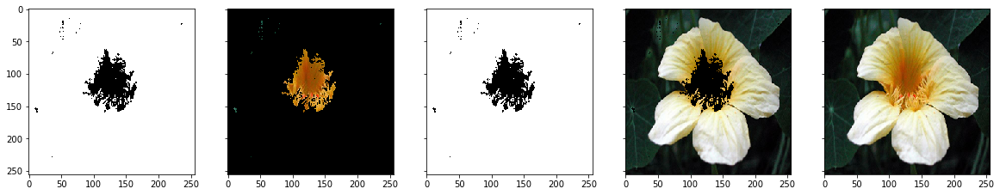

0.0 185.19476


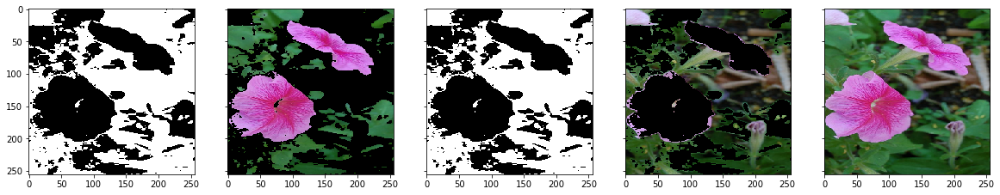

0.0 151.75781


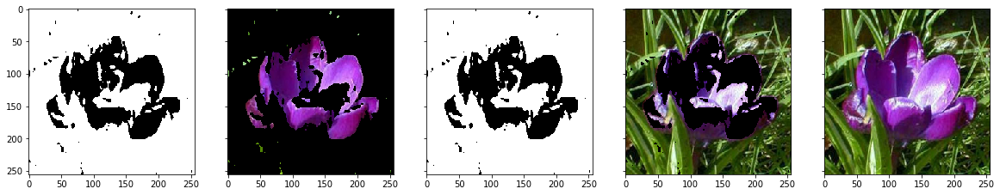

0.0 165.57745


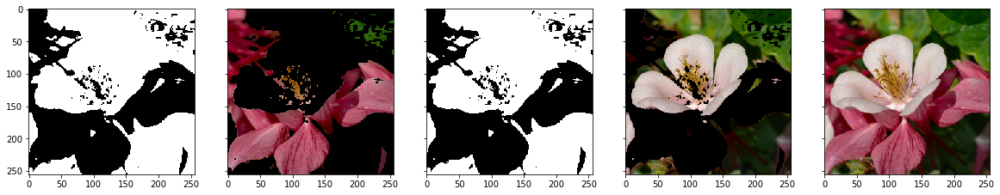

0.0 93.81412


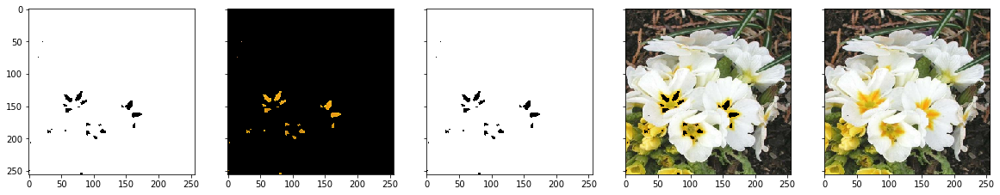

0.0 174.04022


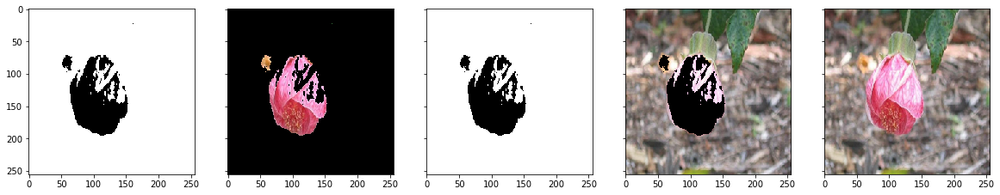

0.0 192.35547


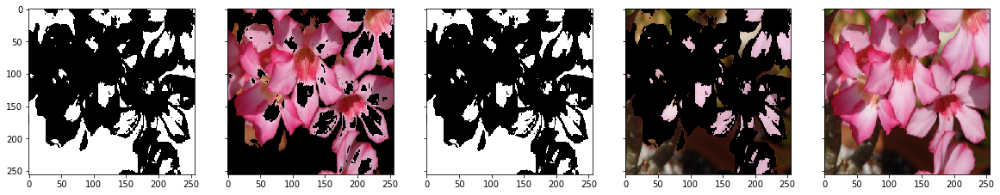

0.0 64.203415


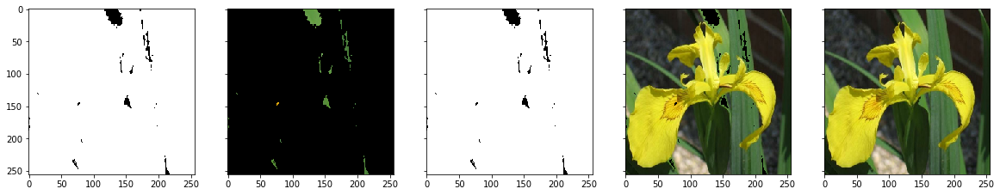

0.0 104.78906


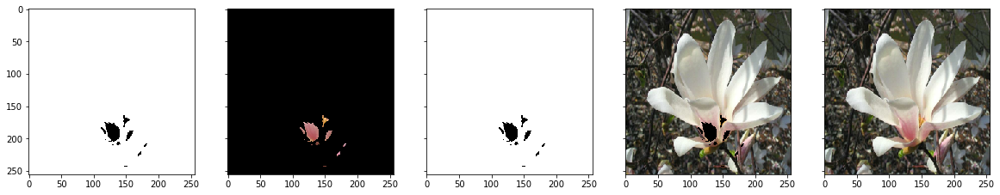

0.0 94.11163


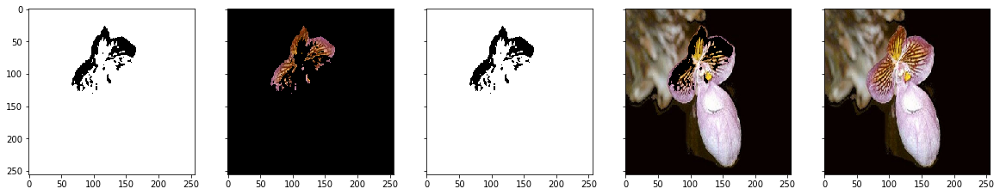

0.0 132.8075


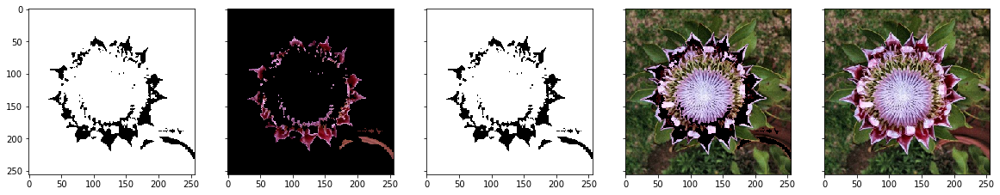

0.0 220.2208


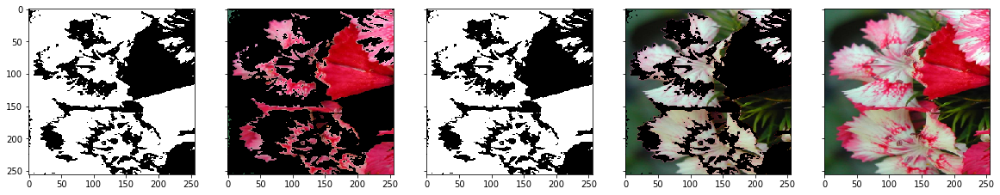

0.0 110.398056


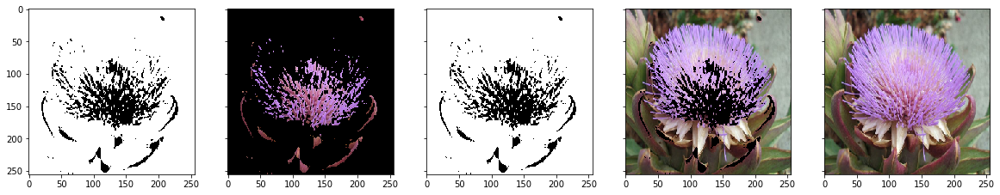

0.0 50.55664


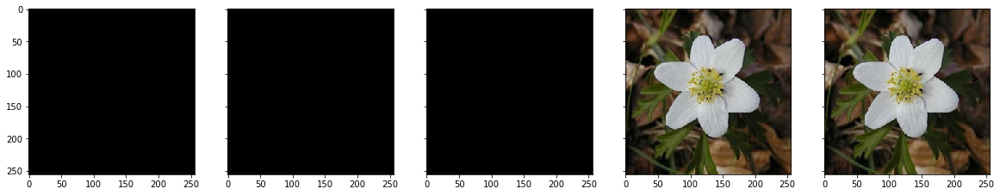

0.0 111.796875


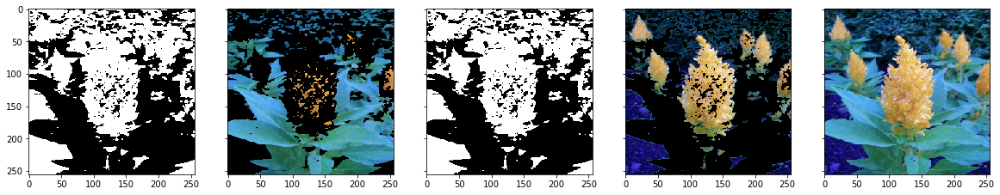

0.0 160.71875


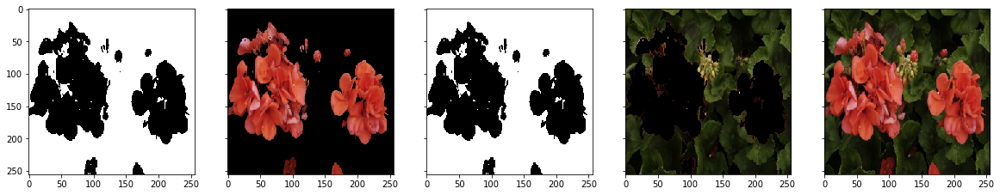

0.0 55.398438


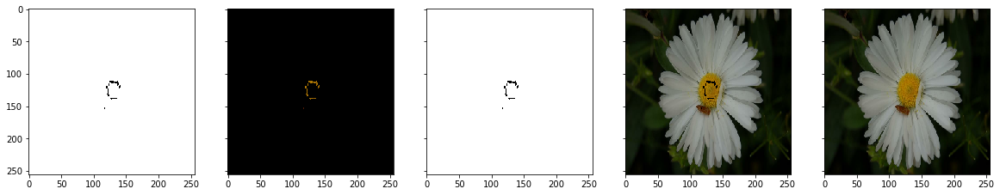

0.0 124.0


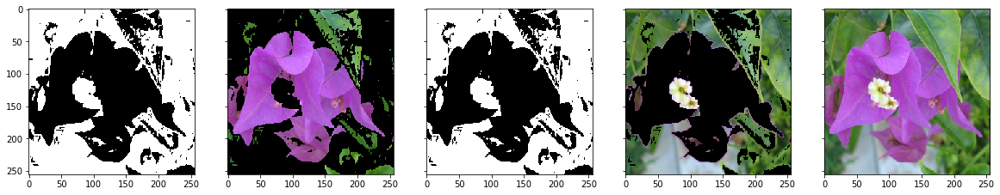

0.0 209.95639


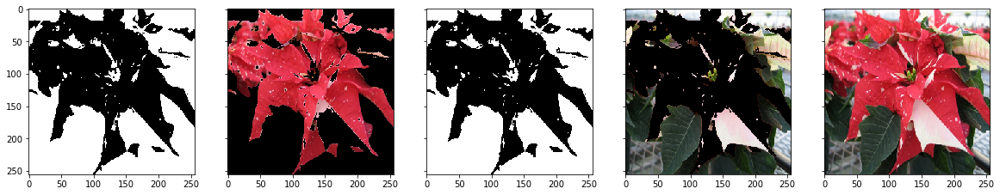

0.0 239.84375


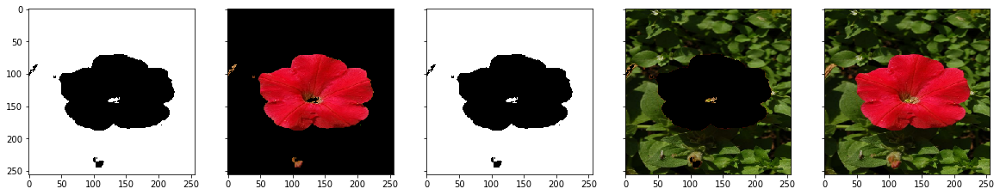

0.0 164.81943


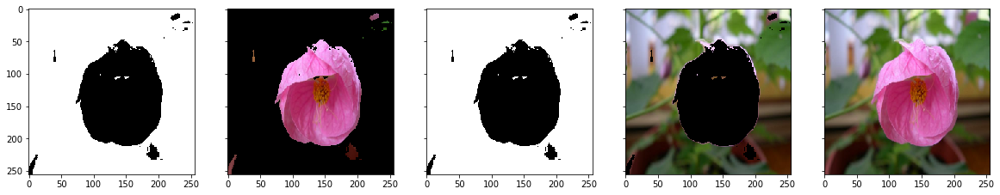

0.0 157.55911


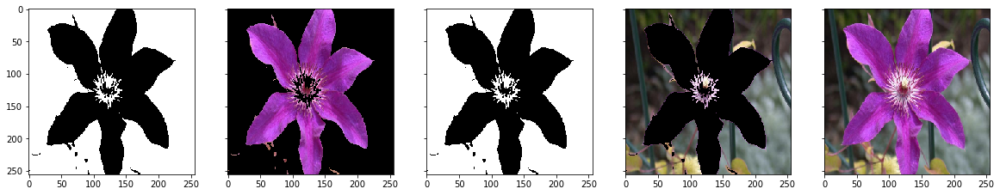

0.0 94.0


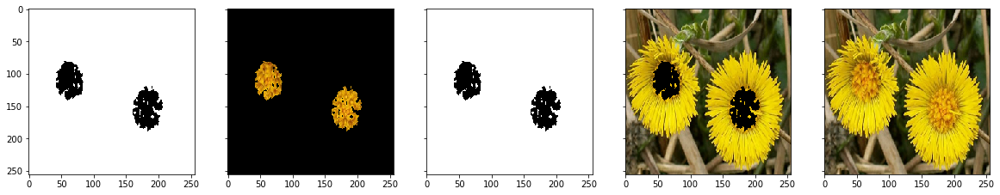

0.0 214.9022


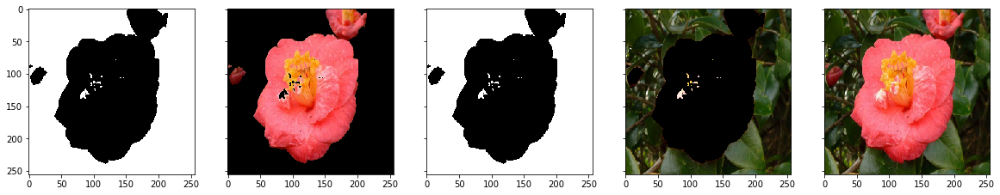

0.0 58.61168


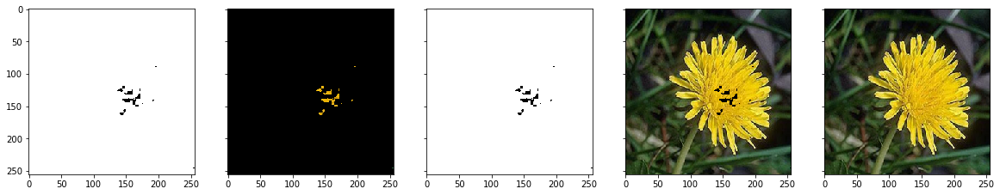

0.0 170.0


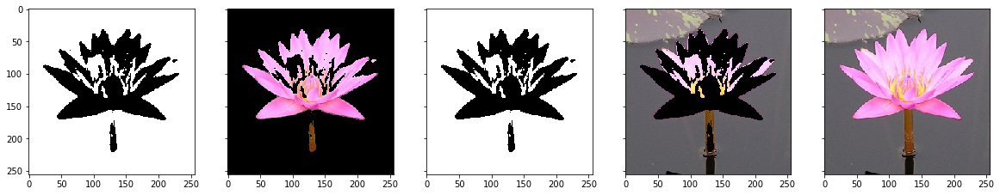

0.0 59.64981


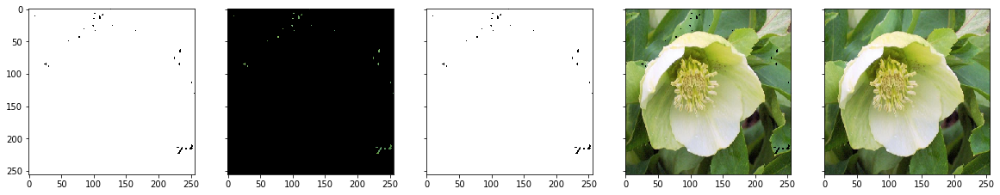

0.0 171.11328


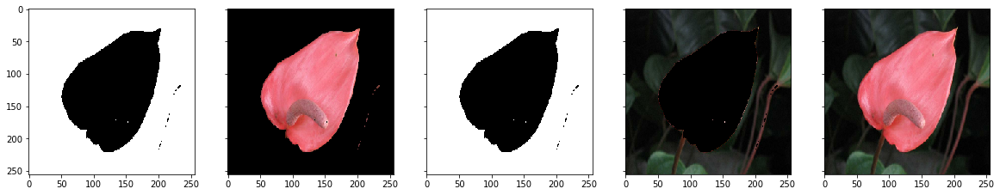

0.0 29.992538


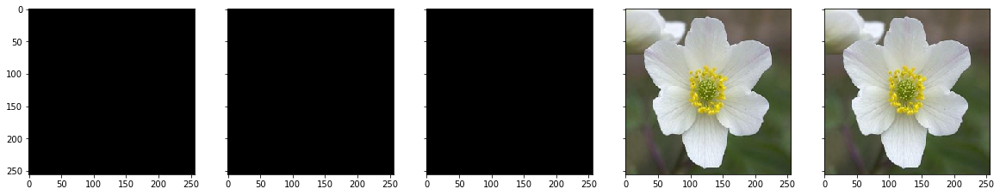

0.0 169.3768


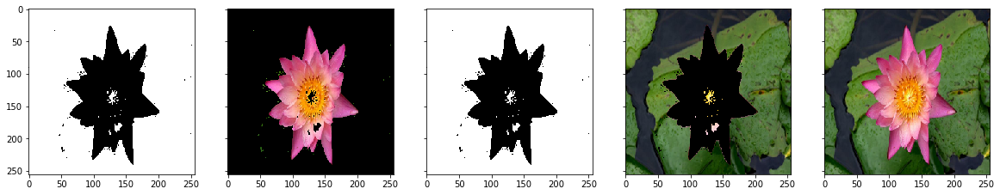

In [17]:
for i in range(20,50):
    img = load_image(randurls[i])
    imgnp = img.numpy()*255
    rgB = np.matrix(imgnp[:,:,0])
    rGb = np.matrix(imgnp[:,:,1])
    Rgb = np.matrix(imgnp[:,:,2])
    I = cv2.absdiff(rGb,rgB)
    print(np.min(I),np.max(I))
    IP = posterization(I/255,0.20)
    #
    IP = np.array(IP,np.uint8)*255
    #
    imgIP = cv2.bitwise_and(img.numpy(), img.numpy(), mask=IP)
    #
    IP_INV = posterization_inv(IP,255)
    #
    imgIP_inv = cv2.bitwise_and(img.numpy(), img.numpy(), mask=IP_INV)
    #
    fig , ax =  plt.subplots(1,5,sharex=True,sharey=True,figsize = (20,5))

    ax[0].imshow(IP,cmap='gray')
    ax[1].imshow(imgIP)
    ax[2].imshow(IP_INV,cmap='gray')
    ax[3].imshow(imgIP_inv)
    ax[4].imshow(img.numpy())

    plt.show()


In [18]:
## Crear funcion que aplica diferentes efectos en orden distinto a las imagenes

##desenfque gaussiano
def Desenfoque_Gaus(img,paramdes=13):
    imgg = cv2.GaussianBlur(img, (paramdes,paramdes), 0)
    return imgg

#posterizaion el mismo definido arriba
# posterizacion (thresholding)
def posterization(img,treshold=0.5):
    img[img >= treshold] = 1.0
    img[img <  treshold] = 0.0
    return img

def posterization_inv(img,max=255):
    img[img >= max] = 2.0
    img[img <= 0.0] = max
    img[img <= 2.0] = 0.0
    return img

def recorta(img):
    imgnp = img*255
    rgB = np.matrix(imgnp[:,:,0])
    rGb = np.matrix(imgnp[:,:,1])
    Rgb = np.matrix(imgnp[:,:,2])
    I = cv2.absdiff(rGb,rgB)
    IP = posterization(I/255,0.20)
    #
    IP = np.array(IP,np.uint8)*255
    #
    #imgIP = cv2.bitwise_and(img.numpy(), img.numpy(), mask=IP)
    #
    IP_INV = posterization_inv(IP,255)
    #
    imgIP_inv = cv2.bitwise_and(imgnp, imgnp, mask=IP_INV)
    imgIP_inv = imgIP_inv/255
    return imgIP_inv

In [19]:
def efectos(img,iterations = 2):
    img = img.numpy()
    for i in range(iterations):
        ef = np.random.rand(3)
        if ef[0] >= 0.5:
            img = Desenfoque_Gaus(img)
        if ef[1] <= 0.5:
            img = posterization(img)
        if ef[2] >= 0.5:
            img = recorta(img)
    return img
    

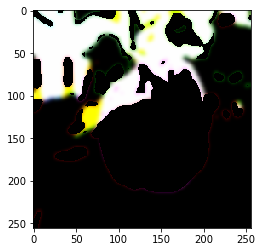

In [20]:
img = load_image(randurls[40])
img = efectos(img)
plt.imshow(img)

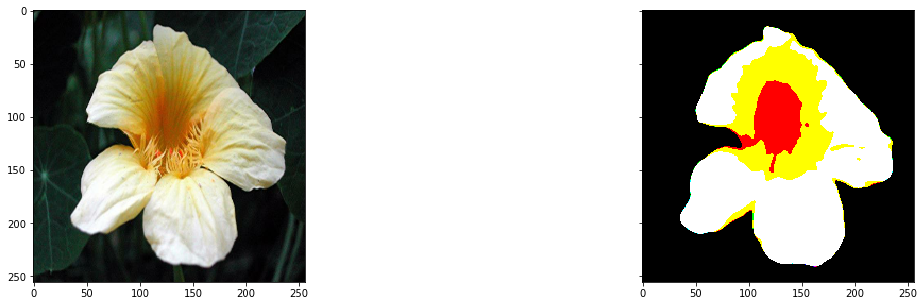

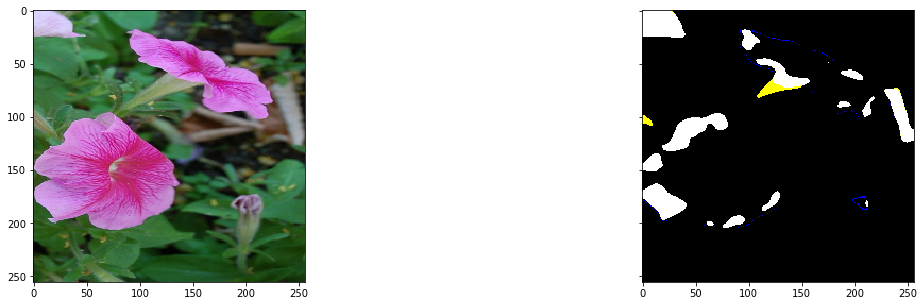

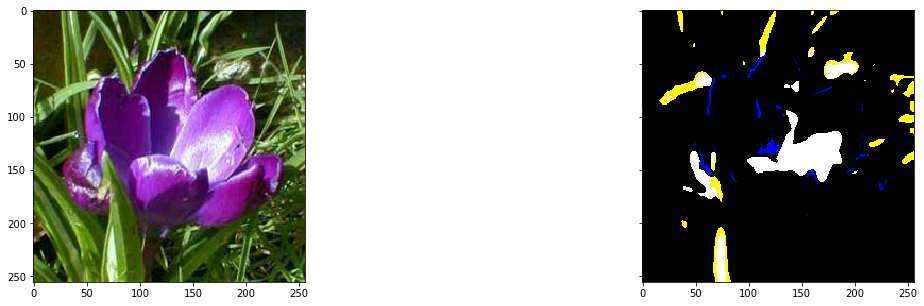

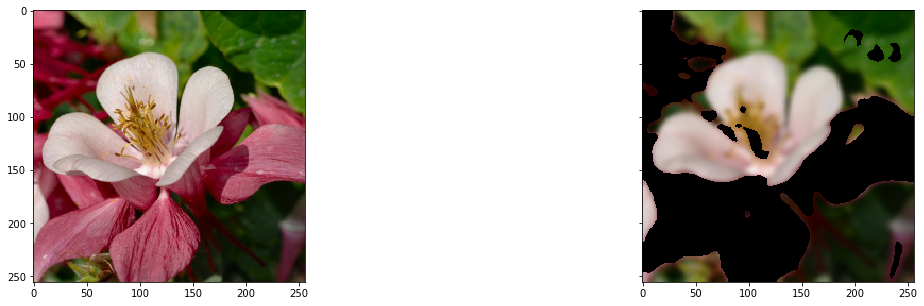

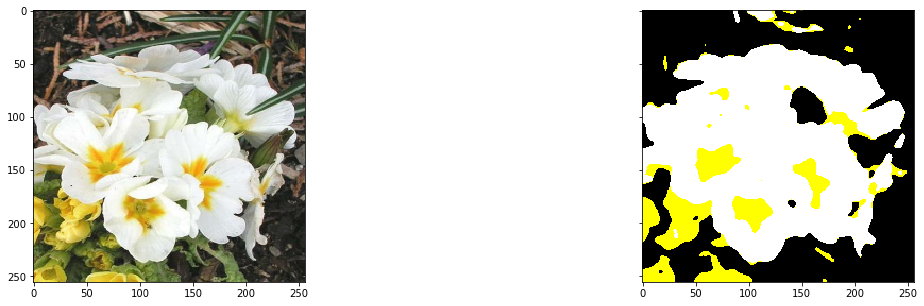

In [21]:
for i in range(20,25):
    img = load_image(randurls[i])
    imgo = img 
    img = efectos(img)
    fig , ax = plt.subplots(1,2,sharex=True,sharey=True,figsize = (20,5))
    ax[0].imshow(imgo)
    ax[1].imshow(img)
    plt.show()

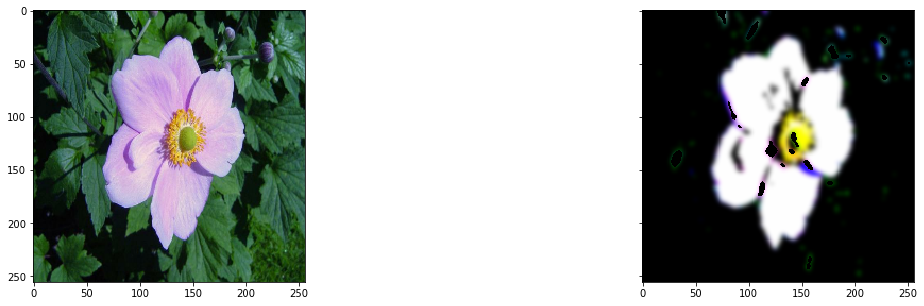

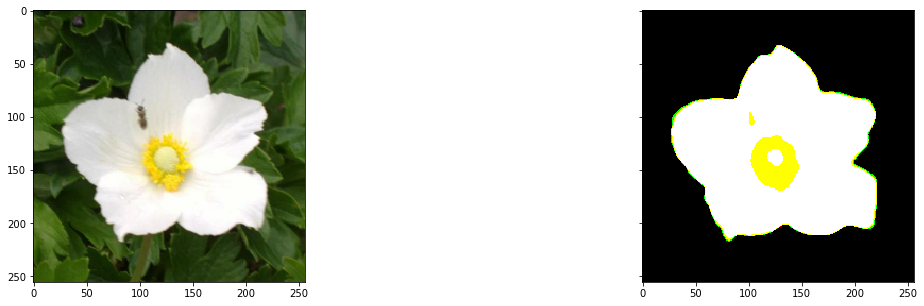

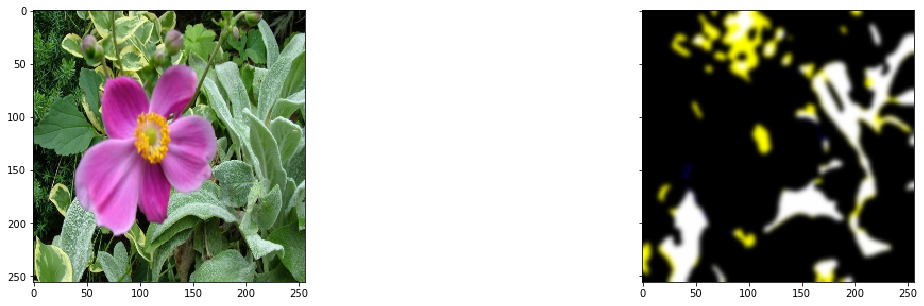

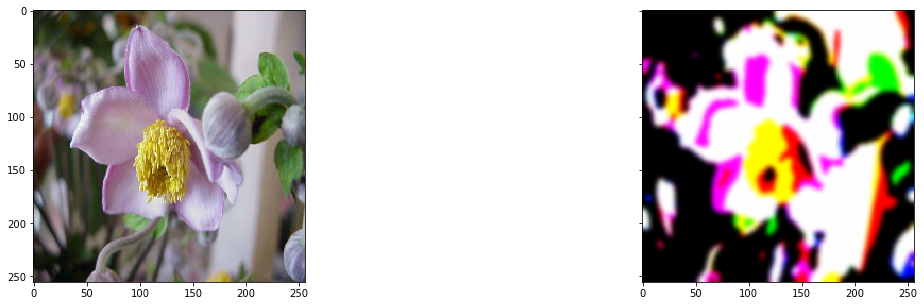

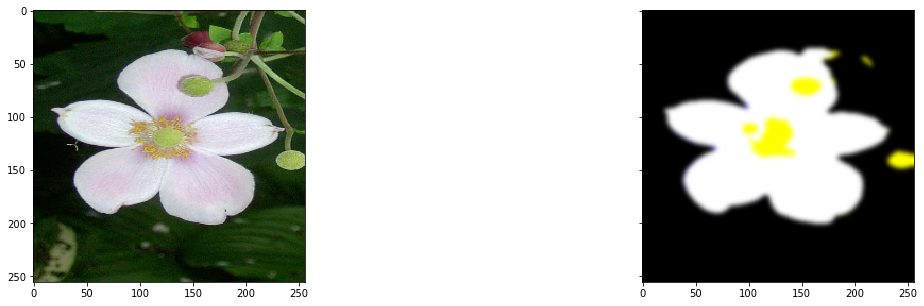

...

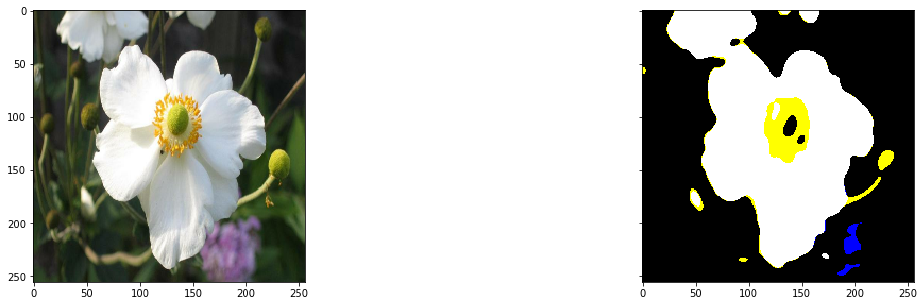

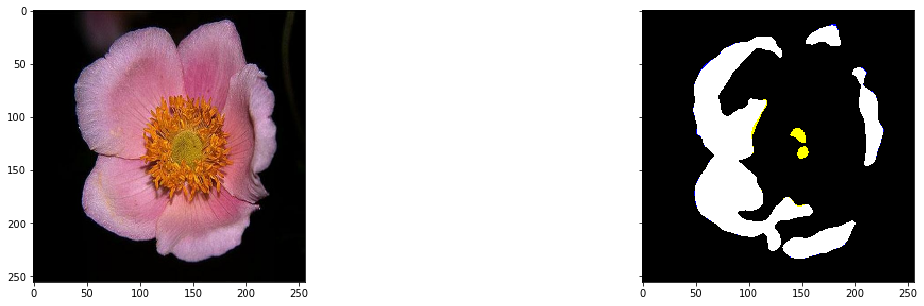

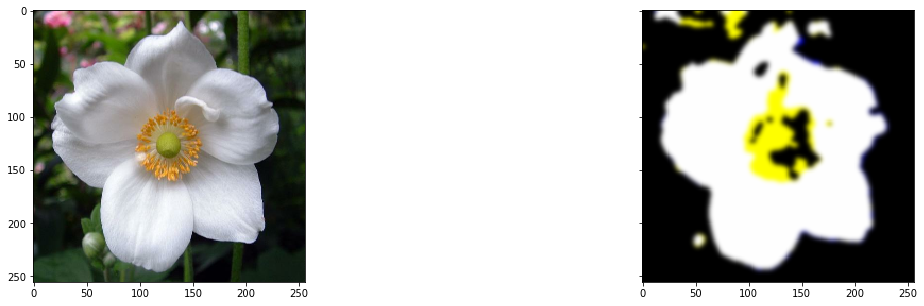

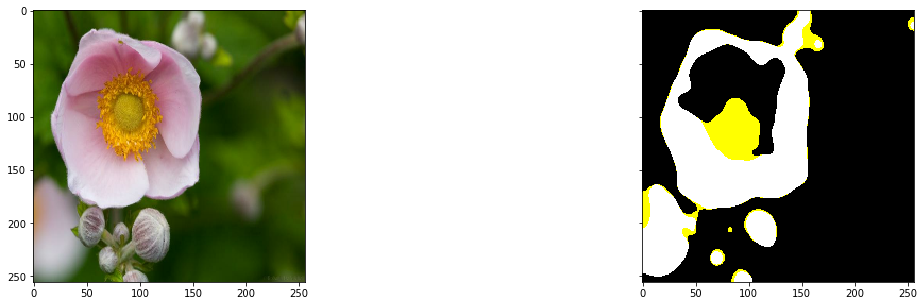

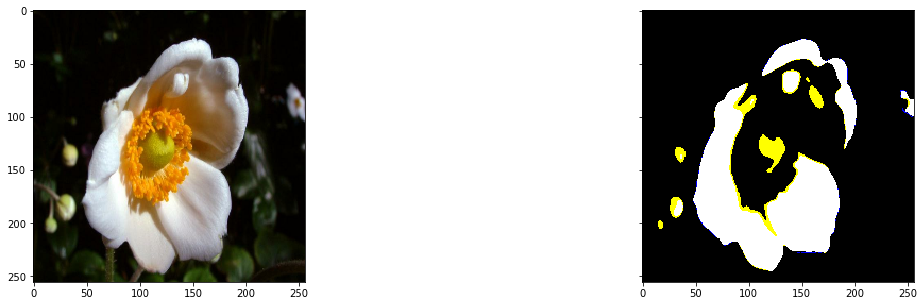

In [202]:
# skimage.io.imread carga la imagen como RGB (o RGBA), pero OpenCV asume que la imagen es BGR o BGRA
from IPython.display import clear_output
for q in range(len(imgurls)):
    filename = imgurls[q]
    img = load_image(filename)
    imgo = img 
    img = efectos(img = img,iterations = 4)
    fig , ax = plt.subplots(1,2,sharex=True,sharey=True,figsize = (20,5))
    ax[0].imshow(imgo)
    ax[1].imshow(img)
    cv2.imwrite(OUPATH + '/' + filename,img*255)
    tf.io.write_file(OUPATH + '2' +'/' + filename ,tf.image.encode_jpeg(img*255))
    plt.show()
    if q%50==0:
        clear_output()